# Class Activity 1

**Course:** Digital Image Processing (Summer 2026)

**Submitted to:** Dr. Jameel Ahmad

**Submission Date:** 06/08/2026

**Students:**
| Name | Registration No. |
|---|---|
| Muhammad Umer | F2023266912 |
| Haseeb Ullah | F20232661009 |

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1i1vjTqcbBbQC4JDK1UvR-EyCTDIvpHNp?usp=sharing)


**Note**: _I didn't just download and run the code, i read the whole chapter 1, then write every piece of code by hand. that's why you will notice that this notebook is a lot bigger than provided in the Book's Github_.


**Note**: _First is all the code, then below are the all theory question answered._


## Reading, Saving, and displaying images with PIL


In [1]:
from PIL import Image

im = Image.open("../data/chp_01_images/parrot.png")
im.show()

im_gray = im.convert("L")

im_gray.save("../data/chp_01_images/parrot_gray.png", format="PNG")

Image.open("../data/chp_01_images/parrot_gray.png").show()

In [2]:
with open("../data/chp_01_images/parrot.png", "rb") as f:
    im = Image.open(f)
    im.show()

In [3]:
import numpy as np

print(im.size)
print(np.array(im).shape)

print(im_gray.size)
print(np.array(im_gray).shape)

(453, 340)
(340, 453, 3)
(453, 340)
(340, 453)


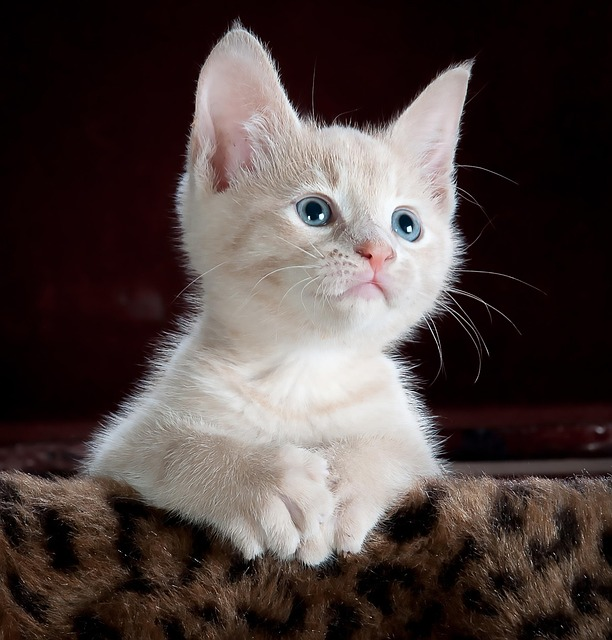

In [4]:
import requests
from io import BytesIO

response = requests.get(
    "https://cdn.pixabay.com/photo/2014/11/30/14/11/cat-551554_640.jpg"
)

if response.status_code == 200:
    img = Image.open(BytesIO(response.content))
    img.show()
else:
    print(f"Failed to get image. Status code: {response.status_code}")
img  # run from jupyter notebook cell

## Reading image with matplotlib


In [5]:
import matplotlib.image as mpimg

im = mpimg.imread("../data/chp_01_images/hill.png")
print(im.shape, im.dtype, im.max(), type(im))

(960, 1280, 3) float32 1.0 <class 'numpy.ndarray'>


In [6]:
import matplotlib.pylab as plt

im = plt.imread("../data/chp_01_images/hill.png")
print(im.shape, im.dtype, im.max(), type(im))

(960, 1280, 3) float32 1.0 <class 'numpy.ndarray'>


## Darkening the image


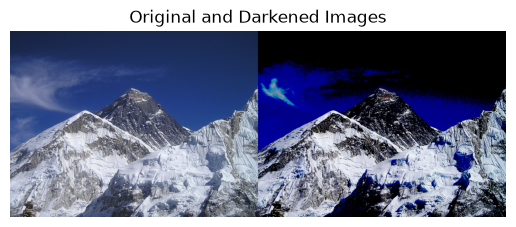

In [7]:
im = im / im.max()  # normalize to [0, 1]

im_dark = im.copy()

im_dark[im_dark < 0.5] = 0

mpimg.imsave("../data/chp_01_images/hill_dark.png", im_dark)

im_dark = mpimg.imread("../data/chp_01_images/hill_dark.png")[
    ..., :3
]  # drop alpha channel if present, current there is no alpha channel in the saved image, but just in case

plt.imshow(np.hstack([im, im_dark]))
plt.axis("off")
plt.title("Original and Darkened Images")
plt.show()

## Displaying image with `matplotlib.pylab`


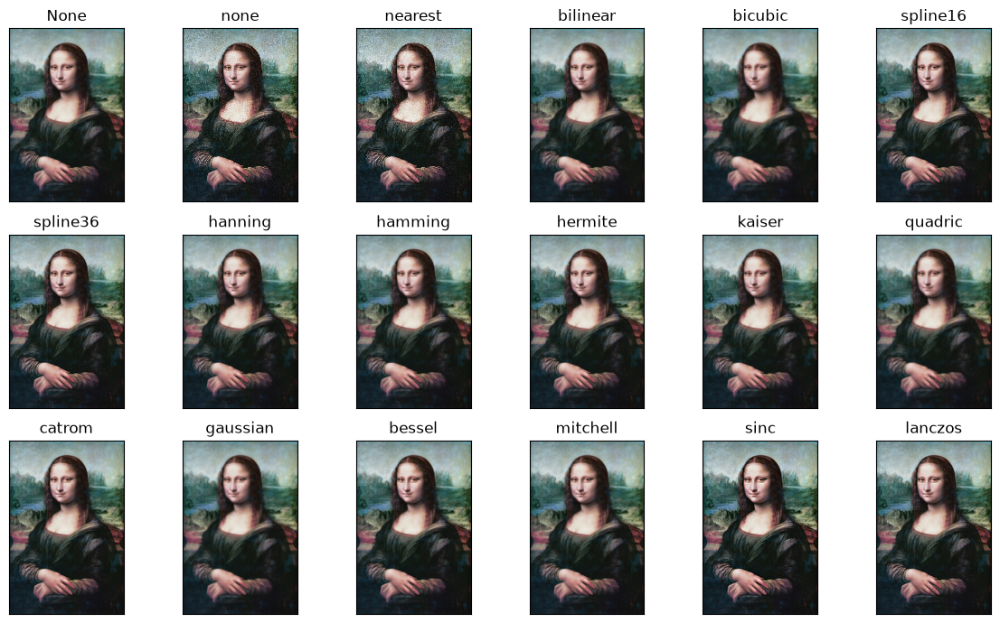

In [8]:
im = mpimg.imread("../data/chp_01_images/monalisa.jpg")

methods = [
    None,
    "none",
    "nearest",
    "bilinear",
    "bicubic",
    "spline16",
    "spline36",
    "hanning",
    "hamming",
    "hermite",
    "kaiser",
    "quadric",
    "catrom",
    "gaussian",
    "bessel",
    "mitchell",
    "sinc",
    "lanczos",
]

fig, axes = plt.subplots(
    nrows=3, ncols=6, subplot_kw={"xticks": [], "yticks": []}, figsize=(12, 7)
)

fig.subplots_adjust(hspace=0.05, wspace=0.05)

for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method))

plt.tight_layout()
plt.show()

## Colormaps


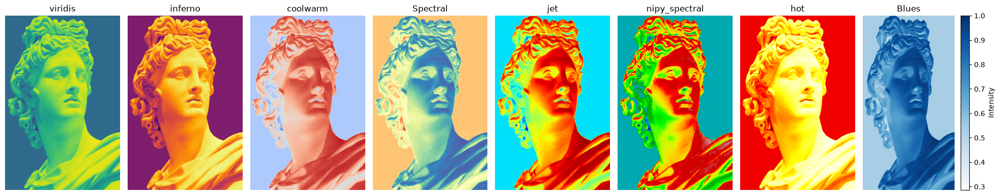

In [9]:
im = plt.imread("../data/chp_01_images/sculpture.png")

im_gray = np.mean(
    im, axis=-1
)  # average over the color channels to convert to grayscale


plt.figure(figsize=(20, 4))

i = 1

for cmap in [
    "viridis",
    "inferno",
    "coolwarm",
    "Spectral",
    "jet",
    "nipy_spectral",
    "hot",
    "Blues",
]:
    plt.subplot(1, 8, i)
    plt.imshow(im_gray, cmap=cmap, aspect="auto")
    plt.title(cmap)
    plt.axis("off")
    i += 1

plt.colorbar(label="Intensity")
plt.tight_layout()
plt.show()

## Reading and saving using `Scikit-Image`


(340, 453, 3) uint8 255 <class 'numpy.ndarray'>
uint8


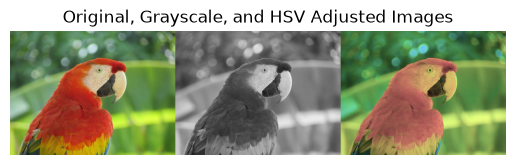

In [10]:
from skimage.io import imread, imread_collection, imshow_collection, imsave
from skimage import color


def min_max_normalize(img, low=0, high=255):
    """Normalizes the pixel values of the image im to the specified"""
    """[low, high] range using min-max scaling"""
    return ((high - low) * (img - img.min()) / (img.max() - img.min())).astype(np.uint8)


im = imread("../data/chp_01_images/parrot.png")

print(im.shape, im.dtype, im.max(), type(im))

im_gray = imread("../data/chp_01_images/parrot.png", as_gray=True)
im_gray = min_max_normalize(im_gray, low=0, high=255)

im_gray = color.gray2rgb(im_gray)  # convert to RGB for visualization

hsv = color.rgb2hsv(im)

hsv[:, :, 1] = 0.5  # set saturation to 0.5

im_hsv_to_rgb = min_max_normalize(color.hsv2rgb(hsv), low=0, high=255)

print(im_hsv_to_rgb.dtype)

imsave("../data/chp_01_images/parrot_hsv.png", im_hsv_to_rgb)

plt.imshow(np.hstack([im, im_gray, im_hsv_to_rgb]))

plt.axis("off")
plt.title("Original, Grayscale, and HSV Adjusted Images")
plt.show()

## Normalizing using the python decorator method


In [11]:
def normalize(func):
    """Decorator to normalize the output of a function to [0, 1] range"""

    def inner(imfile, low, high):
        return min_max_normalize(func(imfile), low, high)

    return inner


@normalize
def imread_norm(imfile, as_gray=True):
    return imread(imfile, as_gray=as_gray)


im_gray = imread_norm("../data/chp_01_images/parrot.png", low=0, high=255)
im_gray.dtype, im_gray.max()

(dtype('uint8'), np.uint8(255))

## Using `Scikit-Image`'s image datasets


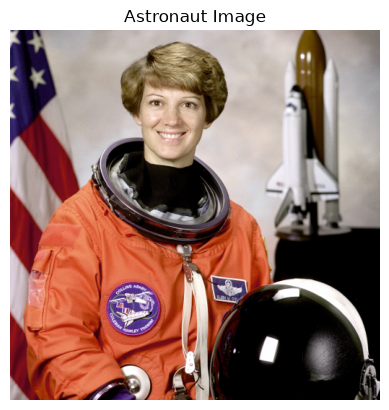

(512, 512) (512, 512)


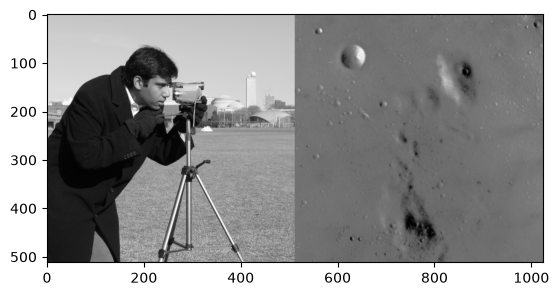

In [12]:
from skimage import data

plt.imshow(data.astronaut())
plt.axis("off")
plt.title("Astronaut Image")
plt.show()

im1, im2 = data.camera(), data.moon()

print(im1.shape, im2.shape)
plt.imshow(np.hstack([im1, im2]), cmap="gray")
plt.show()

## Reading and displaying multiple images at once


4


C:\Users\Muhammad Umer\AppData\Local\Temp\ipykernel_2804\501182560.py:5: FutureWarning: `imshow_collection` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  imshow_collection(images)


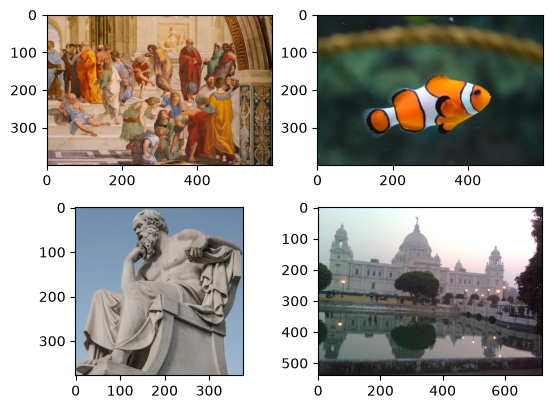

In [13]:
images = imread_collection("../data/chp_01_images/image_dir/*.jpg")

print(len(images))

imshow_collection(images)
plt.show()

## Block views on images


In [14]:
def plot_image(im, title="", fontsize=20):
    plt.imshow(im)
    plt.title(title, fontsize=fontsize)
    plt.axis("off")


def plot_images(
    images, titles, suptitle="", fontsize=20, supfontsize=22, figsize=(15, 7)
):
    n = len(images)
    plt.figure(figsize=figsize)
    plt.gray()

    for i in range(n):
        plt.subplot(1, n, i + 1)
        plot_image(images[i], titles[i], fontsize)

    plt.suptitle(suptitle, size=supfontsize)
    plt.tight_layout()
    plt.show()

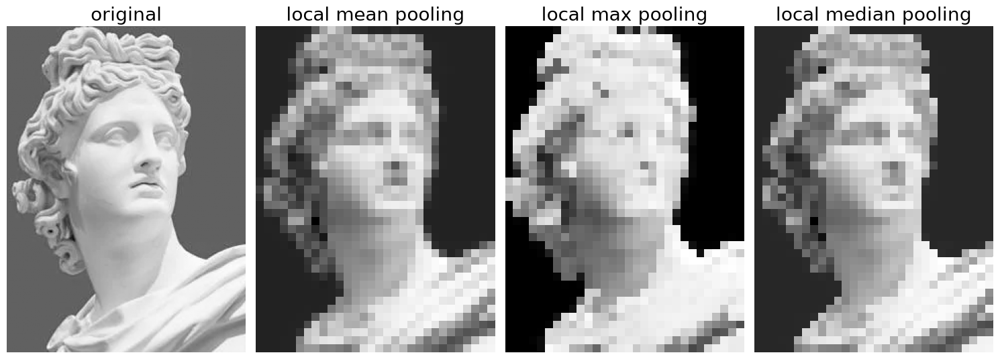

In [16]:
from skimage.util import view_as_blocks

im = color.rgb2gray(imread("../data/chp_01_images/sculpture.png")[..., :3])

block_shape = (8, 8)

# Ensure image dimensions are divisible by block size
pad_height = (block_shape[0] - im.shape[0] % block_shape[0]) % block_shape[0]
pad_width = (block_shape[1] - im.shape[1] % block_shape[1]) % block_shape[1]

if pad_height != 0 or pad_width != 0:
    # optional: pad the image to make it divisible by block size
    im = np.pad(im, ((0, pad_height), (0, pad_width)), mode="reflect")

view = view_as_blocks(im, block_shape)
flatten_view = view.reshape(view.shape[0], view.shape[1], -1)

mean_view = np.mean(
    flatten_view, axis=2
)  # take mean in the last axis (the flattened block)
max_view = np.max(flatten_view, axis=2)
median_view = np.median(flatten_view, axis=2)

plot_images(
    [im, mean_view, max_view, median_view],
    ["original", "local mean pooling", "local max pooling", "local median pooling"],
)

## Reading, Saving with OpenCV


In [17]:
import cv2

image = cv2.imread("../data/chp_01_images/model.png")

cv2.imshow("Model Image", image)

cv2.waitKey(0)  # Wait for a key press to close the window

cv2.destroyAllWindows()  # Close all OpenCV windows

print(image.dtype)

uint8


In [18]:
image_gray = cv2.imread("../data/chp_01_images/model.png", cv2.IMREAD_GRAYSCALE)

cv2.imshow("Grayscale Model Image", image_gray)

cv2.waitKey(0)

-1

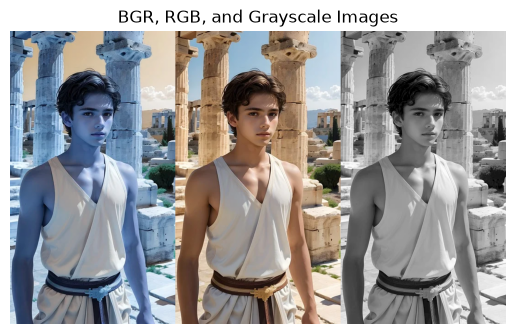

In [19]:
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(
    np.hstack(
        [
            image,
            image_rgb,
            np.repeat(image_gray[..., np.newaxis], 3, axis=-1),
        ]
    )
)

plt.axis("off")
plt.title("BGR, RGB, and Grayscale Images")
plt.show()

In [20]:
cv2.imwrite(
    "../data/chp_01_images/model_yuv.png", cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
)

True

## Reading and Saving images with `imageio`


Frame 5, shape: (512, 512, 4).
Frame 8, shape: (512, 512, 4).
Frame 10, shape: (512, 512, 4).
Frame 12, shape: (512, 512, 4).
Frame 15, shape: (512, 512, 4).


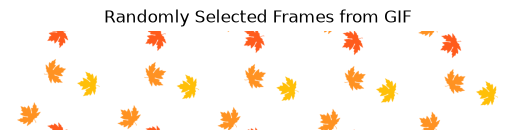

In [25]:
import imageio

gif_path = "../data/chp_01_images/leaves.gif"

# np.random.seed(3)

images = []

with imageio.get_reader(gif_path) as reader:
    for i, frame in enumerate(reader):
        if len(images) < 5:
            if np.random.rand() > 0.75:
                images.append(frame)
                print(f"Frame {i+1}, shape: {frame.shape}.")


plt.imshow(np.hstack(images))
plt.axis("off")
plt.title("Randomly Selected Frames from GIF")
plt.show()

**_Currently there are no images with world.png So we not getting any .gif_**


In [26]:
from glob import glob

frames = [imageio.imread(f) for f in glob("../data/chp_01_images/world/*.png")]

with imageio.get_writer("../data/chp_01_images/world3.gif", fps=10) as writer:
    for frame in frames:
        writer.append_data(frame)

## Converting file format


In [27]:
im = Image.open("../data/chp_01_images/parrot.png")
print(im.mode)

im.save("../data/chp_01_images/parrot.jpg")

RGB


In [28]:
im = Image.open("../data/chp_01_images/hill_alpha.png")
print(im.mode)

im.convert("RGB").save("../data/chp_01_images/hill.jpg")

RGBA


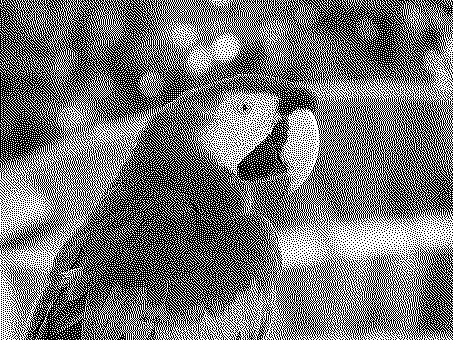

In [29]:
Image.open("../data/chp_01_images/parrot.jpg").convert("1", dither=Image.FLOYDSTEINBERG)

In [30]:
image = Image.open("../data/chp_01_images/parrot.jpg")
image_pallete = image.convert("P")

pallete = image_pallete.getpalette()

modified_pallete = [(value + 19) % 256 for value in pallete]

image_pallete.putpalette(modified_pallete)

image_modified = image_pallete.convert("RGB")

image_modified.save("../data/chp_01_images/modified_pallete_parrot.jpg")

image_modified.show()

## Converting modes with `scikit-image`


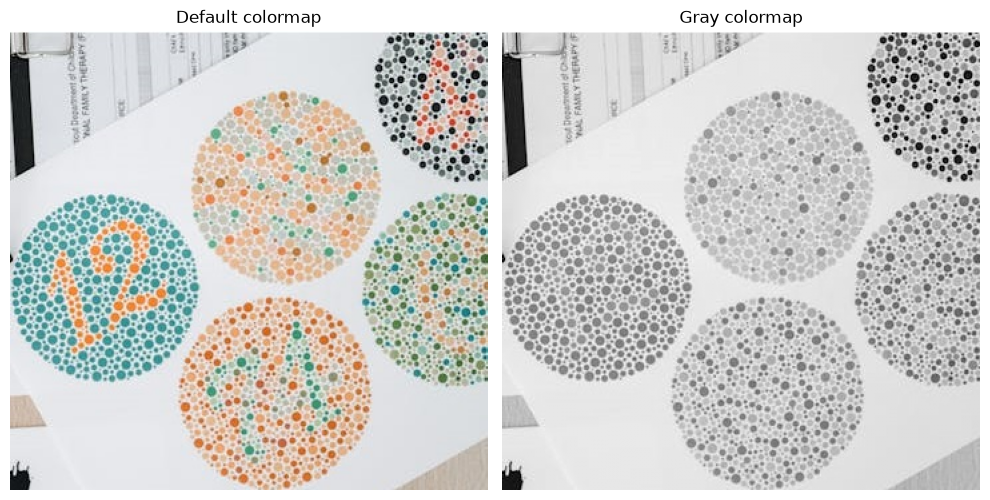

In [36]:
im = imread("../data/chp_01_images/Ishihara.jpeg")

im_g = color.rgb2gray(im)


import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(im)
axes[0].set_title("Default colormap")
axes[0].axis("off")
axes[1].imshow(im_g)
axes[1].set_title("Gray colormap")
axes[1].axis("off")
plt.tight_layout()
plt.show()

## Converting image data types


In [39]:
im = imread("../data/chp_01_images/parrot.png")

print(im.shape, im.dtype, im.max(), type(im))

im_float = im.astype(np.float32) / 255.0  # normalize to [0, 1]
print(im_float.shape, im_float.dtype, im_float.max(), type(im_float))

(340, 453, 3) uint8 255 <class 'numpy.ndarray'>
(340, 453, 3) float32 1.0 <class 'numpy.ndarray'>


### RGB to HSV


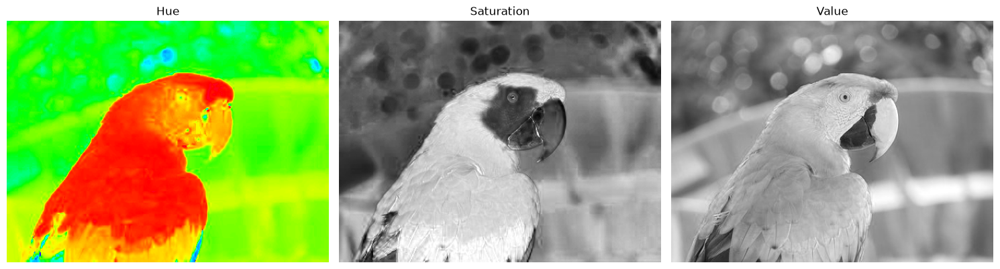

In [45]:
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage import color

im = imread("../data/chp_01_images/parrot.png")
im_hsv = color.rgb2hsv(im)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(im_hsv[:, :, 0], cmap="hsv")
axes[0].set_title("Hue")
axes[0].axis("off")

axes[1].imshow(im_hsv[:, :, 1], cmap="gray")
axes[1].set_title("Saturation")
axes[1].axis("off")

axes[2].imshow(im_hsv[:, :, 2], cmap="gray")
axes[2].set_title("Value")
axes[2].axis("off")

plt.tight_layout()
plt.show()

### RBT to YUV


_When we are displaying the 2d pixels, they will not appear red, green or blue, they will just appear black and white, cause they are just ranging values from 0-255_


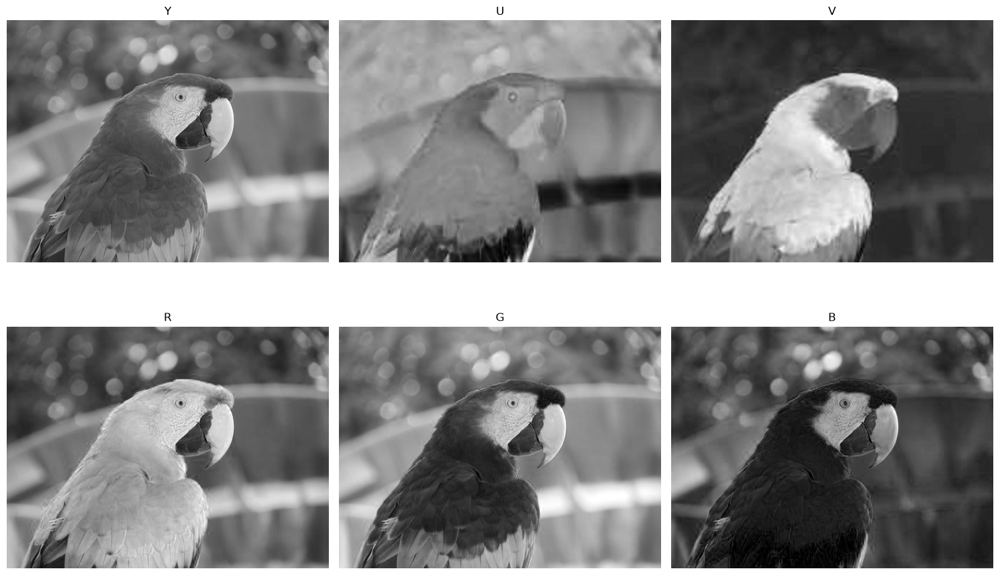

In [53]:
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage import color

im = imread("../data/chp_01_images/parrot.png")
im_yuv = color.rgb2yuv(im)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Top row: Y, U, V channels
axes[0, 0].imshow(im_yuv[:, :, 0])
axes[0, 0].set_title("Y")
axes[0, 0].axis("off")

axes[0, 1].imshow(im_yuv[:, :, 1])
axes[0, 1].set_title("U")
axes[0, 1].axis("off")

axes[0, 2].imshow(im_yuv[:, :, 2])
axes[0, 2].set_title("V")
axes[0, 2].axis("off")

# Bottom row: R, G, B channels
axes[1, 0].imshow(im[:, :, 0])
axes[1, 0].set_title("R")
axes[1, 0].axis("off")

axes[1, 1].imshow(im[:, :, 1])
axes[1, 1].set_title("G")
axes[1, 1].axis("off")

axes[1, 2].imshow(im[:, :, 2])
axes[1, 2].set_title("B")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()

### RGB to CMYK


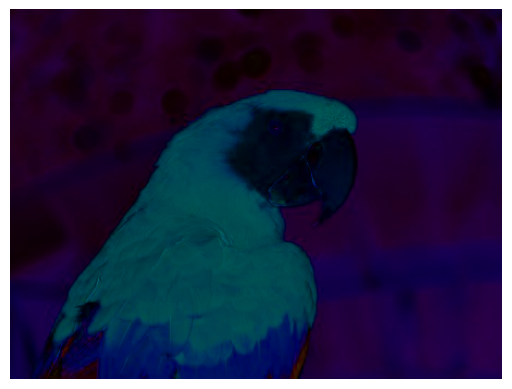

In [57]:
RGB_SCALE, CMYK_SCALE = 255, 100


def rgb2cmyk(rgb):
    """Convert RGB image to CMYK color space."""
    rgb = rgb.astype(np.float32) / RGB_SCALE
    cmy = 1 - rgb
    k = np.min(cmy, axis=-1, keepdims=True)
    cmyk = (cmy - k) / (1 - k + 1e-10)  # Avoid division by zero
    cmyk = np.concatenate((cmyk, k), axis=-1)
    return (cmyk * CMYK_SCALE).astype(np.uint8)


im = plt.imread("../data/chp_01_images/parrot.png")

plt.imshow(rgb2cmyk(im)[..., :3])  # Display only C, M, Y channels
plt.axis("off")
plt.show()

## Color enhancement in the HSV color space


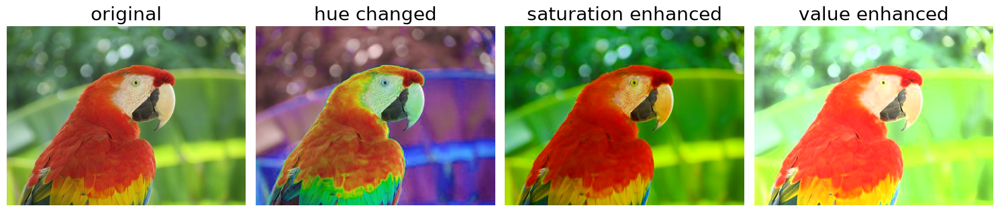

In [61]:
def multiply_channel_hsv(im, i, f):
    im_hsv = color.rgb2hsv(im)
    im_hsv[..., i] = np.minimum(f * im_hsv[..., i], 1)
    return color.hsv2rgb(im_hsv)


im = imread("../data/chp_01_images/parrot.png")


plot_images(
    [
        im,
        multiply_channel_hsv(im, 0, 3),
        multiply_channel_hsv(im, 1, 2.5),
        multiply_channel_hsv(im, 2, 2),
    ],
    ["original", "hue changed", "saturation enhanced", "value enhanced"],
)

### Turning gray scale images in HSV color space


### Displaying the Hue Gradient


(1, 50, 3)


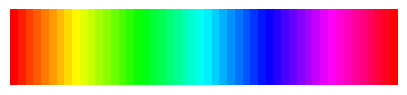

In [63]:
hue_gradient = np.linspace(0, 1)
hsv = np.ones(shape=(1, len(hue_gradient), 3), dtype=float)
hsv[:, :, 0] = hue_gradient
all_hues = color.hsv2rgb(hsv)

fig, ax = plt.subplots(figsize=(5, 2))
# Set image extent so hues go from 0 to 1 and the image is a nice aspect ratio.
ax.imshow(
    all_hues, extent=(0 - 0.5 / len(hue_gradient), 1 + 0.5 / len(hue_gradient), 0, 0.2)
)
ax.set_axis_off()

### Colorize a gray scale image with vintage look


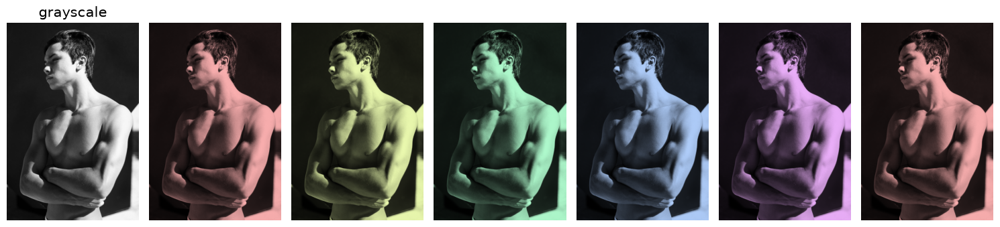

In [65]:
def colorize(im, hue, saturation=1):
    """Add color of the given hue to an RGB im.

    By default, set the saturation to 1 so that the colors pop!
    """
    hsv = color.rgb2hsv(im)
    hsv[:, :, 1] = saturation
    hsv[:, :, 0] = hue
    return color.hsv2rgb(hsv)


im = imread("../data/chp_01_images/man.jpg")
hue_rotations = np.linspace(0, 1, 6)

fig, axes = plt.subplots(nrows=1, ncols=7, sharex=True, sharey=True, figsize=(15, 4))

axes[0].imshow(im), axes[0].set_axis_off(), axes[0].set_title("grayscale", size=15)

for ax, hue in zip(axes.flat[1:], hue_rotations):
    # Turn down the saturation to give it that vintage look.
    tinted_im = colorize(im, hue, saturation=0.3)
    ax.imshow(tinted_im, vmin=0, vmax=1)
    ax.set_axis_off()
fig.tight_layout()

### Creating color pop effect with HSV manipulation


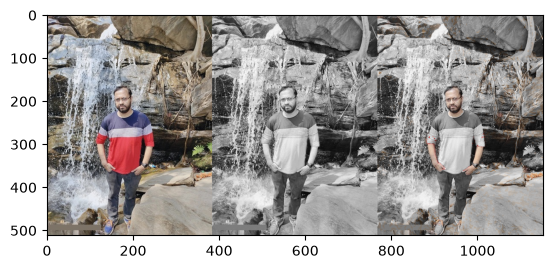

In [ ]:
im = imread("../data/chp_01_images/me.jpg")

im = im / im.max()  # normalize
im_hsv = color.rgb2hsv(im)

im_gray = im_hsv.copy()
im_gray[..., 1] = 0  # set saturation of the pixels to 0
im_gray = color.hsv2rgb(im_gray)  # creates grayscale image

im_hsv[im_hsv[..., 0] > 0.09, 1] = 0  # set all but skin pixel saturation to 0
im_out = color.hsv2rgb(im_hsv)  # creates RGB image with all but
# skin pixels grayed out (popping the skin pixels out)

plt.imshow(np.hstack((im, im_gray, im_out)))yc

plt.show()

## Color enhancement in RGB Space


`enhabnce_rgb` is using this formula to enhance the image

Let $M = \max(r, g, b)$. For each channel $c \in \{r, g, b\}$:

$$
c' = \left(\frac{c}{M}\right)^{f} M
$$


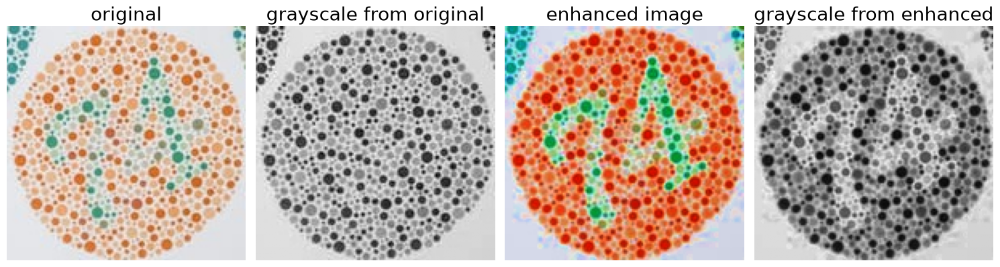

In [71]:
def enhance_rgb(im, f=4):
    im = im.copy()
    r, g, b = im[..., 0], im[..., 1], im[..., 2]
    m = np.maximum(np.maximum(r, g), b)
    im[..., 0], im[..., 1], im[..., 2] = (
        (r / m) ** f * m,
        (g / m) ** f * m,
        (b / m) ** f * m,
    )
    return im


im = imread("../data/chp_01_images/ishihara.png")[..., :3]

im_en = enhance_rgb(im)

plot_images(
    [im, color.rgb2gray(im), im_en, color.rgb2gray(im_en)],
    [
        "original",
        "grayscale from original",
        "enhanced image",
        "grayscale from enhanced",
    ],
)

## Color Shifting in CIELab colorspace


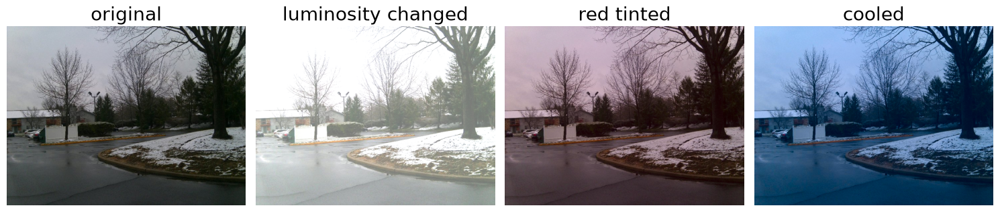

In [72]:
def add_channel_lab(im, i, x):
    im_lab = color.rgb2lab(im)
    im_lab[..., i] = x + im_lab[..., i]
    return color.lab2rgb(im_lab)


im = imread("../data/chp_01_images/scene.jpg")
plot_images(
    [
        im,
        add_channel_lab(im, 0, 50),
        add_channel_lab(im, 1, 10),
        add_channel_lab(im, 2, -25),
    ],
    ["original", "luminosity changed", "red tinted", "cooled"],
)

## Skin color detection with HSV and YCbCr Colorspace


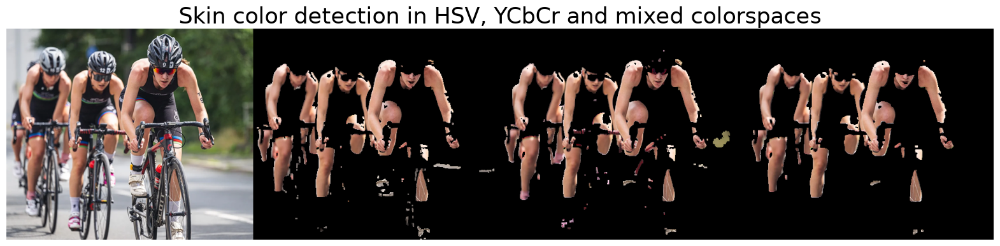

In [74]:
# Constants for HSV and YCrCb skin detection thresholds
HSV_LOWER = (0, 15, 0)
HSV_UPPER = (17, 170, 255)
YCrCb_LOWER = (0, 135, 85)
YCrCb_UPPER = (255, 180, 135)


# def detect_skin_color(img):
def detect_skin_color(
    img: np.ndarray,
) -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
    """
    Detects human skin regions in an image using HSV and YCrCb color space thresholds.

    Args:
        img (np.ndarray): Input BGR image (as loaded by OpenCV).

    Returns:
        Tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray]:
            A tuple of RGB images showing:
            - Original image
            - Skin regions detected via HSV
            - Skin regions detected via YCrCb
            - Combined mask of both methods
    """
    # converting from gbr to hsv color space
    img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    # skin color range for hsv color space
    HSV_mask = cv2.inRange(img_HSV, HSV_LOWER, HSV_UPPER)
    HSV_mask = cv2.morphologyEx(HSV_mask, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))
    # converting from gbr to YCbCr color space
    img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    YCrCb_mask = cv2.inRange(img_YCrCb, YCrCb_LOWER, YCrCb_UPPER)
    # skin color range for YCbCr color space
    YCrCb_mask = cv2.morphologyEx(YCrCb_mask, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8))
    # merge skin detection (YCbCr and hsv)
    global_mask = np.bitwise_and(YCrCb_mask, HSV_mask)
    global_mask = cv2.medianBlur(global_mask, 3)
    global_mask = cv2.morphologyEx(
        global_mask, cv2.MORPH_OPEN, np.ones((4, 4), np.uint8)
    )

    img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    out_HSV = cv2.cvtColor(img & color.gray2rgb(HSV_mask), cv2.COLOR_BGR2RGB)
    out_YCrCb = cv2.cvtColor(img & color.gray2rgb(YCrCb_mask), cv2.COLOR_BGR2RGB)
    out_global = cv2.cvtColor(img & color.gray2rgb(global_mask), cv2.COLOR_BGR2RGB)
    return img_RGB, out_HSV, out_YCrCb, out_global


img = cv2.imread("../data/chp_01_images/cycling.png")
img_RGB, out_HSV, out_YCrCb, out_global = detect_skin_color(img)

plt.figure(figsize=(20, 7))
plt.imshow(np.hstack((img_RGB, out_HSV, out_YCrCb, out_global))), plt.axis("off")
plt.title("Skin color detection in HSV, YCbCr and mixed colorspaces", size=25)
plt.show()

## Converting the image data structures


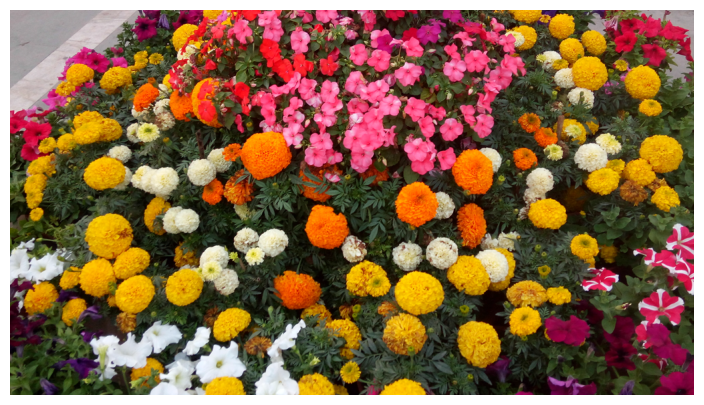

In [75]:
im = Image.open(
    "../data/chp_01_images/flowers.jpg"
)  # read image into an Image object with PIL
im = np.array(im)  # create a numpy ndarray from the Image object
plt.figure(figsize=(10, 5))
plt.imshow(im)  # use skimage imshow to display the image
plt.axis("off")
plt.show()

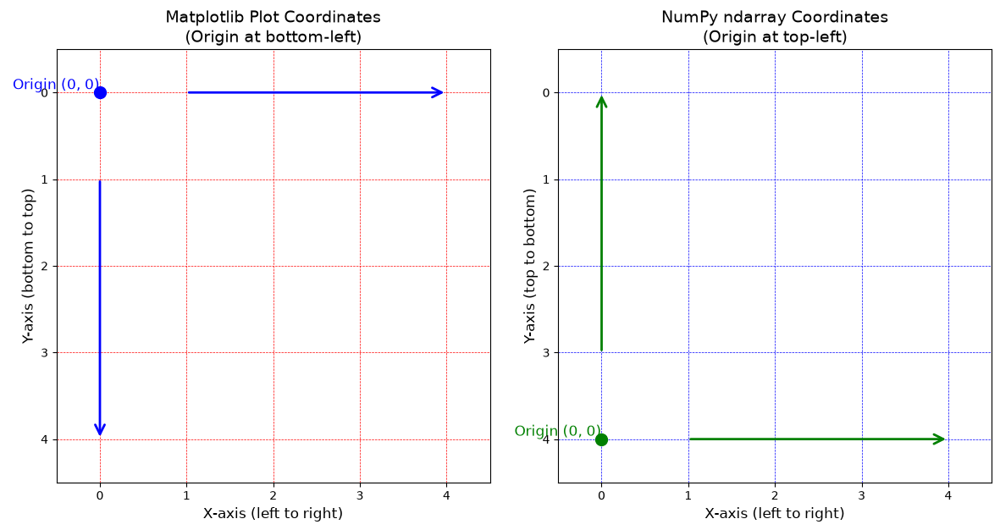

In [76]:
import numpy as np
import matplotlib.pyplot as plt

# Create a sample image array
image_array = (255 * np.ones((5, 5))).astype(np.uint8)

# Plot using Matplotlib with default coordinates
plt.figure(figsize=(12, 6))

# Subplot 1: Matplotlib coordinates
plt.subplot(1, 2, 1)
plt.imshow(image_array, cmap="gray_r", origin="upper")
plt.title("Matplotlib Plot Coordinates\n(Origin at bottom-left)", fontsize=14)
plt.xlabel("X-axis (left to right)", fontsize=12)
plt.ylabel("Y-axis (bottom to top)", fontsize=12)
plt.grid(True, which="both", color="red", linestyle="--", linewidth=0.5)

# Add x and y axis arrows for Matplotlib coordinates
plt.annotate(
    "",
    xy=(4, 0),
    xytext=(1, 0),
    arrowprops=dict(arrowstyle="->", color="blue", linewidth=2, mutation_scale=20),
)
plt.annotate(
    "",
    xy=(0, 4),
    xytext=(0, 1),
    arrowprops=dict(arrowstyle="->", color="blue", linewidth=2, mutation_scale=20),
)

# Mark the origin (0, 0) in Matplotlib coordinates
plt.scatter([0], [0], color="blue", s=100, zorder=5)
plt.text(
    0,
    0,
    " Origin (0, 0)",
    fontsize=12,
    verticalalignment="bottom",
    horizontalalignment="right",
    color="blue",
)

# Subplot 2: NumPy coordinates
plt.subplot(1, 2, 2)
plt.imshow(image_array, cmap="gray_r", origin="upper")
plt.title("NumPy ndarray Coordinates\n(Origin at top-left)", fontsize=14)
plt.xlabel("X-axis (left to right)", fontsize=12)
plt.ylabel("Y-axis (top to bottom)", fontsize=12)
plt.grid(True, which="both", color="blue", linestyle="--", linewidth=0.5)

# Add x and y axis arrows for NumPy coordinates
plt.annotate(
    "",
    xy=(4, 4),
    xytext=(1, 4),
    arrowprops=dict(arrowstyle="->", color="green", linewidth=2, mutation_scale=20),
)
plt.annotate(
    "",
    xy=(0, 0),
    xytext=(0, 3),
    arrowprops=dict(arrowstyle="->", color="green", linewidth=2, mutation_scale=20),
)

# Mark the origin (0, 0) in NumPy coordinates
plt.scatter([0], [4], color="green", s=100, zorder=5)
plt.text(
    0,
    4,
    " Origin (0, 0)",
    fontsize=12,
    verticalalignment="bottom",
    horizontalalignment="right",
    color="green",
)

plt.tight_layout()
plt.show()

### Cropping with array slicing


$$
\text{mask} = \left(X - \frac{l_x}{2}\right)^2 + \left(Y - \frac{l_y}{2}\right)^2 > \frac{l_x l_y}{4}
$$


[104 144 144]


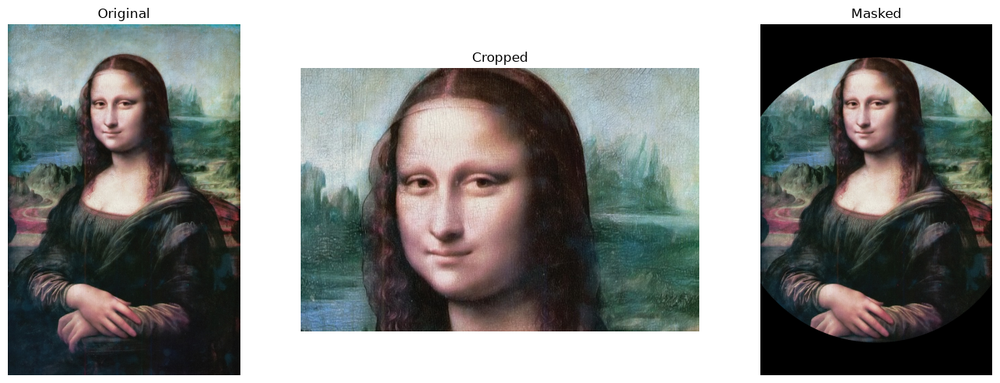

In [94]:
mona = mpimg.imread(
    "../data/chp_01_images/monalisa.jpg"
)  # read the image from disk as a numpy ndarray
lx, ly = mona.shape[:2]

print(mona[0, 40])


cropped_mona = mona[120:510, 160:750, :]

X, Y = np.ogrid[0:lx, 0:ly]

mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4

masked_mona = mona.copy()
masked_mona[np.where(mask)] = 0

# plot mona, cropped_mona and masked_mona side-by-side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(mona)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(cropped_mona)
axes[1].set_title("Cropped")
axes[1].axis("off")

axes[2].imshow(masked_mona)
axes[2].set_title("Masked")
axes[2].axis("off")

plt.tight_layout()
plt.show()

### Adjusting brightness and contrast in color image


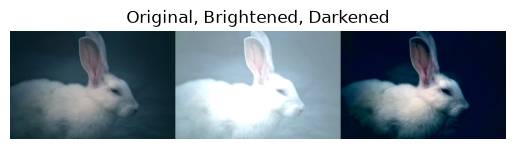

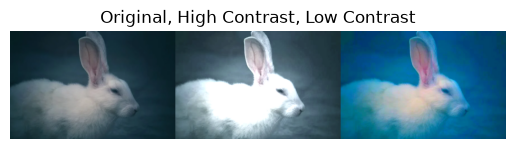

In [103]:
from skimage.color import rgb2lab, lab2rgb


def adjust_brightness(im, shift):
    im_lab = rgb2lab(im)
    im_lab[..., 0] = np.clip(im_lab[..., 0] + shift, 0, 255)
    im_out = lab2rgb(im_lab)
    return (255 * im_out / im_out.max()).astype(np.uint8)


def adjust_contrast(im, scale):
    im_lab = rgb2lab(im)
    im_lab[..., 0] = np.clip(im_lab[..., 0] * scale, 0, 255)
    im_out = lab2rgb(im_lab)
    return (255 * im_out / im_out.max()).astype(np.uint8)


im = imread("../data/chp_01_images/rabbit.png")[..., :3]

im_brightened, im_darkened = (
    adjust_brightness(im, 50),
    adjust_brightness(im, -25),
)

im_high_contrast, im_low_contrast = (
    adjust_contrast(im, 2),
    adjust_contrast(im, 0.25),
)

plt.imshow(np.hstack((im, im_brightened, im_darkened)))
plt.title("Original, Brightened, Darkened")
plt.axis("off")
plt.show()

plt.imshow(np.hstack((im, im_high_contrast, im_low_contrast)))
plt.title("Original, High Contrast, Low Contrast")
plt.axis("off")
plt.show()

### Horizontal and Vertical Flipping


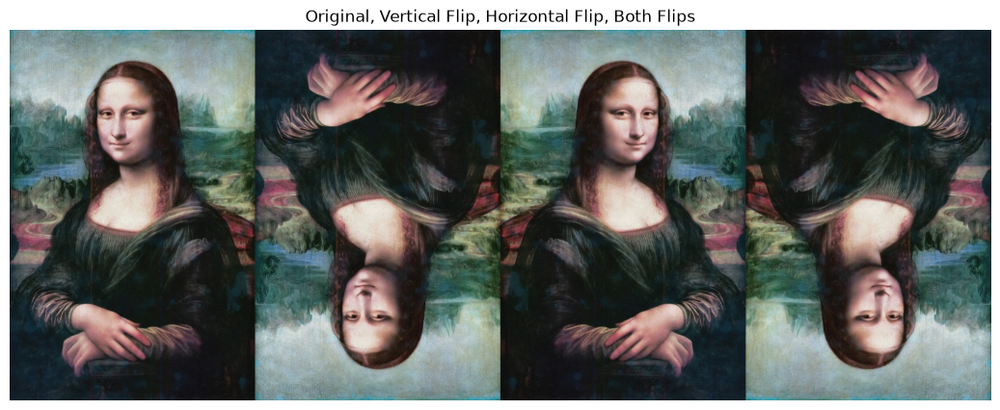

In [104]:
v_flipped_mona = np.flipud(mona)  # Vertical flip
h_flipped_mona = np.fliplr(mona)  # Horizontal flip
vh_flipped_mona = np.fliplr(v_flipped_mona)  # Both vert. & horiz. flip

# Plot images side-by-side with np.hstack()
plt.figure(figsize=(15, 5))
plt.imshow(np.hstack((mona, v_flipped_mona, h_flipped_mona, vh_flipped_mona)))
plt.title("Original, Vertical Flip, Horizontal Flip, Both Flips")
plt.axis("off")
plt.show()

## Simple Image Morphing: α-blending of two images using cross-dissolving


### Simple image morphing with cross-dissolving

Alpha blending (cross-fade) combines two images using a weighted linear combination:

$$
I_{\text{blend}} = (1 - \alpha) \cdot I_1 + \alpha \cdot I_2
$$

where:

- $I_1$ — the first image (young photo)
- $I_2$ — the second image (current photo)
- $\alpha \in [0, 1]$ — the blending weight
- $I_{\text{blend}}$ — the resulting blended image

**Behavior:**

- When $\alpha = 0$: $I_{\text{blend}} = I_1$ → only the first image is visible
- When $\alpha = 1$: $I


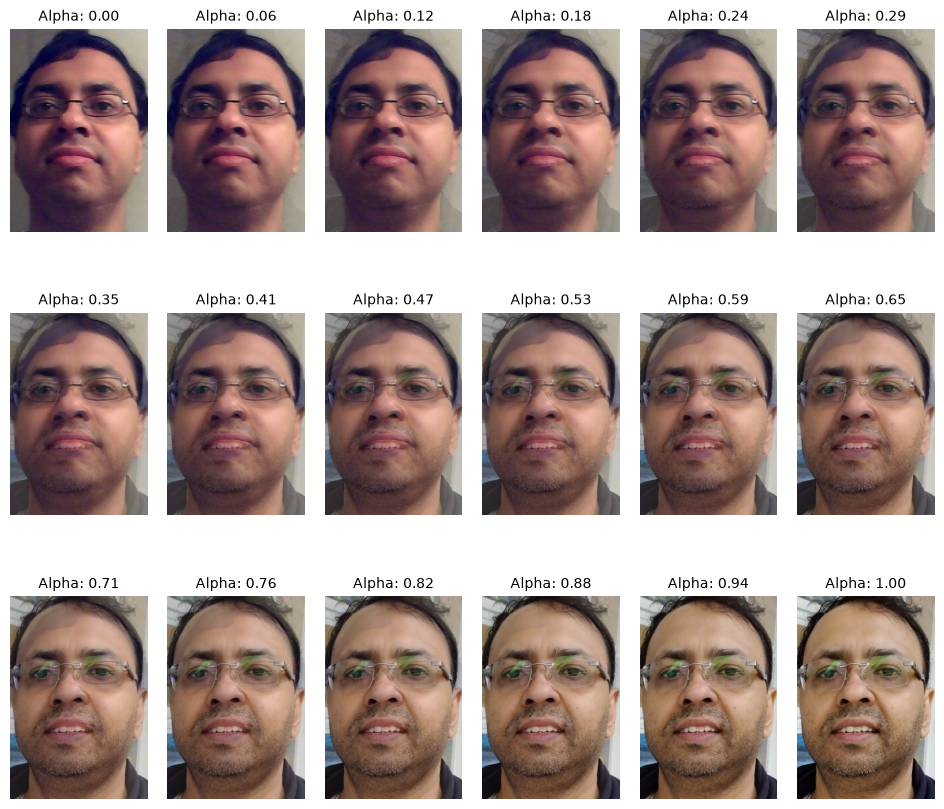

In [106]:
im1 = mpimg.imread("../data/chp_01_images/me_young.jpg")
im2 = mpimg.imread("../data/chp_01_images/me_now.jpg")
im1, im2 = im1 / im1.max(), im2 / im2.max()

i = 1
plt.figure(figsize=(12, 10))
for alpha in np.linspace(0, 1, 18):
    plt.subplot(3, 6, i)
    plt.title(f"Alpha: {alpha:.2f}", fontsize=10)
    plt.imshow((1 - alpha) * im1 + alpha * im2)
    plt.axis("off")
    i += 1
plt.subplots_adjust(wspace=0.1, hspace=0.4)
plt.show()

### Dividing two images to remove illumination pattern


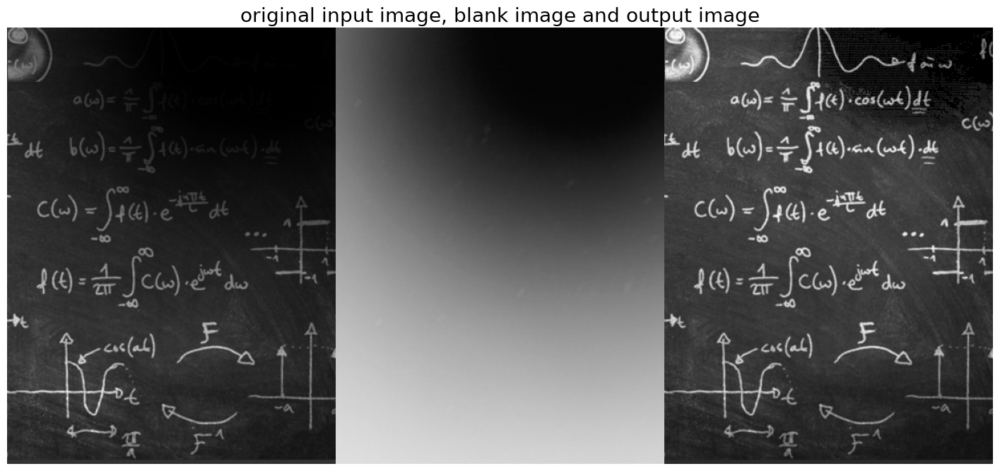

In [108]:
# Load the two images
img1 = cv2.imread("../data/chp_01_images/board_illum_pat.png", 0)
img2 = cv2.imread("../data/chp_01_images/pattern.png", 0)

# Divide the two images
out = np.divide(img1.astype(float), img2.astype(float) + 0.001)
out = out / out.max()
out = (255 * out).astype("uint8")

# Display the original and enhanced images
plt.figure(figsize=(18, 9))
plt.gray()
plt.imshow(np.hstack((img1, img2, out))), plt.axis("off")
plt.title("original input image, blank image and output image", size=20)
plt.show()

## Applying Sepia Color Filter

A **sepia filter** gives an image the warm, reddish-brown monochromatic tone associated with old photographs. It works by transforming each pixel's RGB values into a new set of RGB values using a fixed linear combination (weighted mix) of the original Red, Green, and Blue channels.

The transformation can be written as a matrix multiplication:

$$
\begin{bmatrix} R' \\ G' \\ B' \end{bmatrix}
=
\begin{bmatrix}
0.393 & 0.769 & 0.189 \\
0.349 & 0.686 & 0.168 \\
0.272 & 0.534 & 0.131
\end{bmatrix}
\begin{bmatrix} R \\ G \\ B \end{bmatrix}
$$

where:

- $R, G, B$ — the original pixel's red, green, and blue values
- $R', G', B'$ — the new (sepia-toned) pixel values
- Each output channel is a **weighted sum** of all three input channels, not just its corresponding one

**Why it looks sepia:**

- The weights are designed so that reds and greens dominate over blue in every output channel, since sepia tones lean warm (yellow-brown) rather than cool (blue).
- The result is clipped to the valid range $[0, 1]$ (or $[0, 255]$ for 8-bit images) using `np.clip`, since the weighted sums can slightly exceed the valid pixel range.

**Effect:** Unlike a simple grayscale conversion (which reduces the image to a single luminance value), sepia keeps three channels but constrains their relationship so the final image tint skews toward brown/orange — mimicking the chemical aging process of old photographic prints.


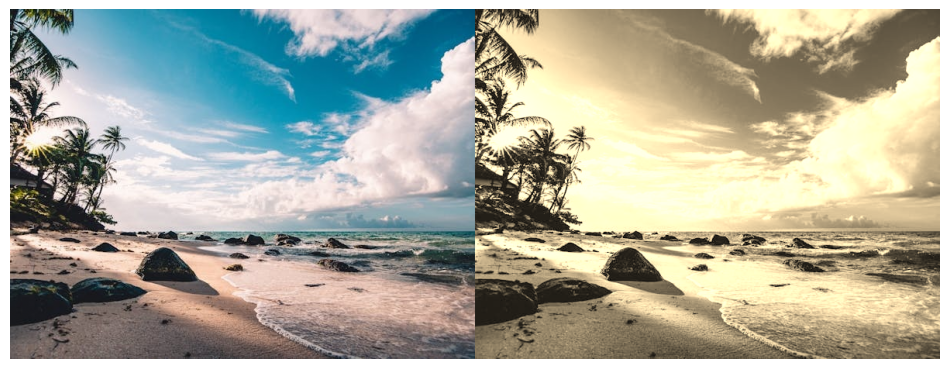

In [ ]:
def sepia_filter(im):
    R, G, B = im[..., 0], im[..., 1], im[..., 2]
    im_out = im.copy()
    im_out[..., 0] = 0.393 * R + 0.769 * G + 0.189 * B
    im_out[..., 1] = 0.349 * R + 0.686 * G + 0.168 * B
    im_out[..., 2] = 0.272 * R + 0.534 * G + 0.131 * B
    im_out = np.clip(im_out, 0, 1)
    return im_out


im = imread("../data/chp_01_images/sea_beach.jpeg")
im = im / im.max()
im_out = sepia_filter(im)
plt.figure(figsize=(12, 5))
plt.imshow(np.hstack((im, im_out))), plt.axis("off")
plt.show()

time (np): 0.032235 sec
time (PIL): 0.318434 sec


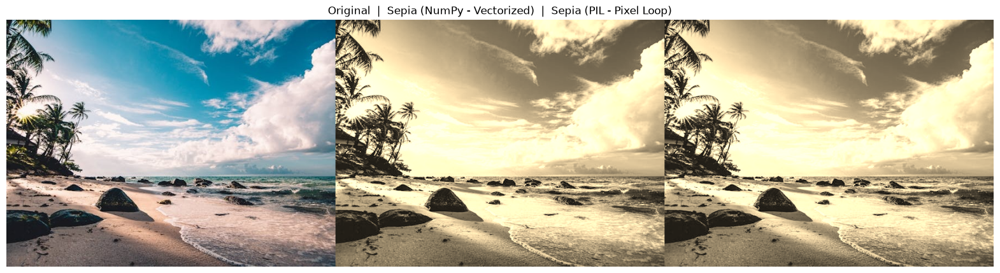

In [111]:
from time import time


def sepia_filter_PIL(image_path):
    img = Image.open(image_path)
    width, height = img.size
    pixels = img.load()  # create the pixel map
    for py in range(height):
        for px in range(width):
            r, g, b = img.getpixel((px, py))
            pixels[px, py] = (
                min(255, int(0.393 * r + 0.769 * g + 0.189 * b)),
                min(255, int(0.349 * r + 0.686 * g + 0.168 * b)),
                min(255, int(0.272 * r + 0.534 * g + 0.131 * b)),
            )
    return img


def sepia_filter_np(image_path):
    im = plt.imread(image_path)
    im = im / im.max()
    R, G, B = im[..., 0], im[..., 1], im[..., 2]
    im_out = np.dstack(
        (
            0.393 * R + 0.769 * G + 0.189 * B,
            0.349 * R + 0.686 * G + 0.168 * B,
            0.272 * R + 0.534 * G + 0.131 * B,
        )
    )
    im_out = np.clip(im_out, 0, 1)
    return (255 * im_out).astype(np.uint8)


img_path = "../data/chp_01_images/sea_beach.jpeg"
start = time()
im_out_np = sepia_filter_np(img_path)
print("time (np): {:03f} sec".format(time() - start))
start = time()
im_out_PIL = sepia_filter_PIL(img_path)
print("time (PIL): {:03f} sec".format(time() - start))
im, im_out_PIL = plt.imread(img_path), np.array(im_out_PIL)

plt.figure(figsize=(20, 7))
plt.imshow(np.hstack((im, im_out_np, im_out_PIL)))
plt.title("Original  |  Sepia (NumPy - Vectorized)  |  Sepia (PIL - Pixel Loop)")
plt.axis("off")
plt.show()

## Drawing Contour lines for an image


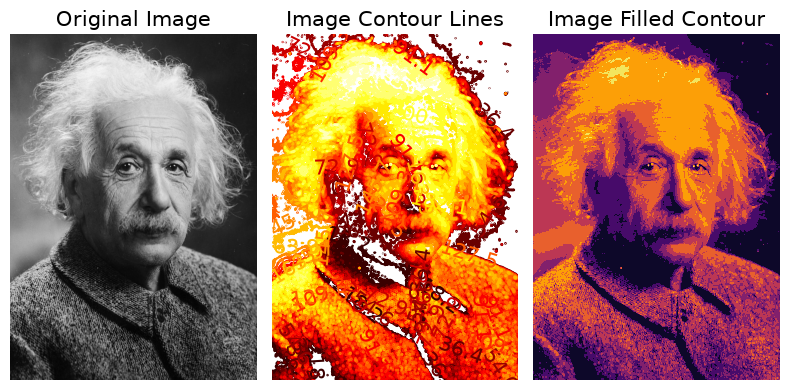

In [113]:
im = imread("../data/chp_01_images/einstein.jpg")  # read image as a numpy ndarray

plt.figure(figsize=(8, 4))

plt.subplot(131)
plt.imshow(im, cmap="gray", aspect="auto")
plt.axis("off")
plt.title("Original Image", size=15)

plt.subplot(132)
cs = plt.contour(np.flipud(im), levels=np.linspace(0, 255, 15), cmap=plt.cm.hot)
plt.clabel(cs, fontsize=15, inline=True)
plt.axis("off")
plt.title("Image Contour Lines", size=15)

plt.subplot(133)
plt.title("Image Filled Contour", size=15)
plt.contourf(np.flipud(im), cmap="inferno")
plt.axis("off")

plt.tight_layout()
plt.show()

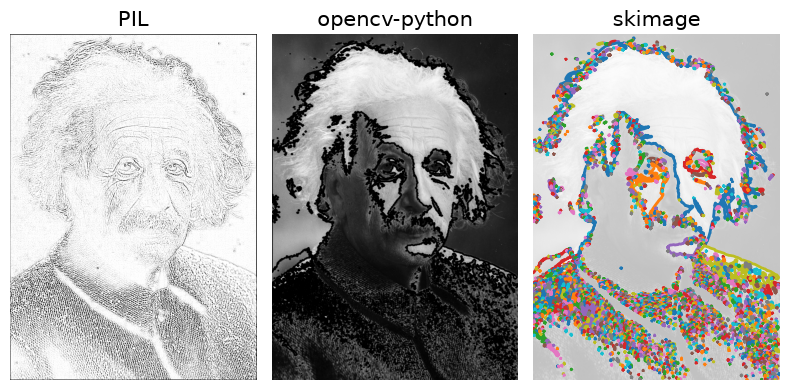

In [114]:
from PIL import Image, ImageFilter
from skimage import measure
import cv2

im = Image.open("../data/chp_01_images/einstein.jpg")
im_ctr = im.filter(ImageFilter.CONTOUR)

im = cv2.imread("../data/chp_01_images/einstein.jpg")
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(im_gray, 127, 255, 0)
contours, hierarchy = cv2.findContours(
    image=thresh, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_SIMPLE
)
cv2.drawContours(
    image=im_gray,
    contours=contours,
    contourIdx=-1,
    color=(0, 0, 0),
    thickness=2,
    lineType=cv2.LINE_AA,
)

im = imread("../data/chp_01_images/einstein.jpg", True)  # read image as a numpy ndarray
im = im / im.max()
contours = measure.find_contours(im, 0.5)  # , fully_connected="high")

plt.figure(figsize=(8, 4))
plt.gray()

plt.subplot(131)
plt.imshow(im_ctr, aspect="auto")
plt.axis("off")
plt.title("PIL", size=15)

plt.subplot(132)
plt.imshow(im_gray, aspect="auto")
plt.axis("off")
plt.title("opencv-python", size=15)

plt.subplot(133)
plt.imshow(im, aspect="auto", alpha=0.25)
plt.axis("off")
plt.title("skimage", size=15)
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

plt.tight_layout()
plt.show()

# <u>_All the remaining theory questions_</u>


## Part A: Warm-Up and Theoretical Concepts

### Task 1.1 - Short Answers

**(a) Define a pixel. How does its representation differ between a grayscale image and an RGB image?**

A pixel (picture element) is the smallest addressable unit of a digital image, representing the intensity or color value at a specific spatial location (x, y). In a grayscale image, each pixel is represented by a single value, usually an integer between 0 and 255 for 8-bit images, where 0 is black and 255 is white. In an RGB image, each pixel is represented by three separate values, one each for the Red, Green, and Blue channels, so a pixel is stored as a triplet like (R, G, B), giving a much larger range of possible colors (256 x 256 x 256 combinations for 8-bit channels).

**(b) What are the two steps involved in digitizing a continuous image f(x, y)? Name them and briefly describe each.**

The two steps are sampling and quantization.

- Sampling: This is the process of converting the continuous spatial coordinates (x, y) into discrete coordinates. The continuous image is measured at regular intervals, producing a grid of pixel locations. The rate of sampling determines the spatial resolution of the resulting digital image.
- Quantization: This is the process of converting the continuous intensity or amplitude values at each sampled point into a finite set of discrete levels. For example, an 8-bit image quantizes intensity into 256 discrete levels (0-255). The number of quantization levels determines the tonal or gray-level resolution of the image.

**(c) Explain, in your own words, the difference between image processing and computer vision.**

Image processing is mainly concerned with transforming an image into another image, for example enhancing contrast, removing noise, resizing, or changing color spaces. The input is an image and the output is also an image, and the goal is usually to improve visual quality or prepare the image for further analysis. Computer vision, on the other hand, is concerned with extracting meaning or understanding from an image, such as detecting objects, recognizing faces, or classifying scenes. The input is an image, but the output is information or a decision, such as a label, a bounding box, or a description. In short, image processing works at the pixel level to produce a better image, while computer vision works at a higher level to produce understanding.

**(d) Why does OpenCV's cv2.imread() require a color-space conversion (cv2.COLOR_BGR2RGB) before displaying an image with Matplotlib, while PIL and scikit-image do not?**

OpenCV reads and stores color images internally in BGR (Blue, Green, Red) channel order, which was a historical design choice made when OpenCV was first developed. Matplotlib, however, expects image arrays in RGB order when displaying them with imshow(). If an image read by OpenCV is passed directly to Matplotlib without conversion, the red and blue channels will appear swapped, giving the image an unnatural bluish or reddish tint. PIL and scikit-image, by contrast, read images directly into RGB order by default, so their output is already compatible with Matplotlib and no extra conversion step is needed.

**(e) Fill in the blank:**

In a NumPy image array, the origin **(0,0)** is located at the **top-left** corner, whereas in a default Matplotlib plot the origin is at the **bottom-left** corner.

---

### Question 2: Image Representation

**(a) Explain the mathematical representation of a digital image. How is a grayscale image different from a color image in terms of array representation?**

A digital image can be represented mathematically as a two-dimensional function f(x, y), where x and y are spatial coordinates and the value of f at any point gives the intensity or brightness at that point. When this function is digitized through sampling and quantization, it becomes a matrix of discrete values, which is how images are stored in a computer as arrays.

In terms of array representation, a grayscale image is stored as a 2D array (height x width), where each element holds a single intensity value, typically ranging from 0 to 255 for an 8-bit image. A color image, in contrast, is stored as a 3D array (height x width x channels), where the third dimension usually has three layers corresponding to the Red, Green, and Blue channels. This means a color image essentially stacks three grayscale-like planes on top of each other, and combining the intensity values at each pixel position across the three channels produces the final visible color.

**(b) What is the difference between spatial sampling and amplitude quantization in image digitization? Provide examples.**

Spatial sampling refers to how finely the continuous image is divided in terms of its spatial coordinates, that is, how many pixel locations are used to represent the image. A higher sampling rate means more pixels are used to capture the same physical scene, resulting in higher spatial resolution and finer detail. For example, an image sampled at 1920x1080 will show much more detail than the same scene sampled at 320x240, since more sample points are captured across the same area.

Amplitude quantization refers to how many discrete intensity or color levels are used to represent the brightness at each sampled point. A higher number of quantization levels allows smoother transitions between shades, while fewer levels cause visible banding or posterization. For example, an 8-bit grayscale image with 256 levels will show smooth gradients, while a 2-bit image with only 4 levels will show harsh, blocky transitions between gray shades even though the spatial resolution stays the same.

---

### Question 3: Color Spaces

**(a) Compare and contrast the RGB and HSV color spaces. Why is HSV preferred for color-based segmentation tasks?**

RGB (Red, Green, Blue) is an additive color model where each pixel is described by the intensity of its red, green, and blue components. It is well suited to how displays and cameras capture and render color, but it mixes color and brightness information together within all three channels, which makes it awkward to isolate a specific color or to adjust brightness independently.

HSV (Hue, Saturation, Value) separates color information differently. Hue represents the actual color type (like red, green, or blue) as an angle on a color wheel, Saturation represents the purity or intensity of that color, and Value represents the brightness. Because hue is isolated into a single channel, tasks like detecting a specific color become much simpler since they only require thresholding one channel instead of dealing with combinations of three interdependent channels.

HSV is preferred for color-based segmentation because lighting changes mostly affect the Value channel while leaving Hue relatively stable, so a segmentation method based on hue is more robust to shadows, highlights, and varying illumination than one based directly on RGB values. This makes it much easier to define a consistent range for a target color, such as skin tone or a specific colored object, regardless of lighting conditions.

**(b) Explain the conversion from RGB to YUV color space. Write the transformation matrix and describe its applications in video compression.**

The RGB to YUV conversion separates an image into a luminance component (Y), which represents brightness, and two chrominance components (U and V), which represent color information. This separation is based on the fact that the human eye is far more sensitive to changes in brightness than to changes in color, which YUV takes advantage of.

The standard conversion (ITU-R BT.601) is given by:

```
Y =  0.299R + 0.587G + 0.114B
U = -0.147R - 0.289G + 0.436B   (also written as 0.492(B - Y))
V =  0.615R - 0.515G - 0.100B   (also written as 0.877(R - Y))
```

In matrix form:

$$
\begin{bmatrix} Y \\ U \\ V \end{bmatrix} =
\begin{bmatrix} 0.299 & 0.587 & 0.114 \\ -0.147 & -0.289 & 0.436 \\ 0.615 & -0.515 & -0.100 \end{bmatrix}
\begin{bmatrix} R \\ G \\ B \end{bmatrix}
$$

In video compression, this separation is extremely useful because the chrominance channels (U and V) can be sampled at a lower resolution than the luminance channel (Y) without a noticeable loss in perceived quality, since the human eye is less sensitive to color detail. This technique, called chroma subsampling (common formats include 4:2:0 and 4:2:2), significantly reduces the amount of data that needs to be stored or transmitted, which is why YUV (or related formats like YCbCr) is the standard color space used in video codecs such as H.264, H.265, and MPEG.

---

## Part C: Color Space Exploration

### Task 3.1 - Perceptual Effect of Saturation Scaling

**Explain what happens perceptually when saturation approaches 0 and when it is amplified.**

When the Saturation channel is scaled down toward 0, the colors in the image gradually lose their vividness and the image approaches a grayscale appearance, since saturation controls how much a color differs from a neutral gray at the same brightness level. At saturation exactly 0, the image becomes fully grayscale even though the Hue and Value channels are unchanged, because hue has no visible effect once saturation is zero.

When the Saturation channel is amplified (multiplied by a factor greater than 1 and clipped to the valid range), the colors become more vivid and intense, making the image look more vibrant or even artificially oversaturated. Details that were subtle in color become exaggerated, and at very high amplification the image can start to look unnatural, with colors appearing overly bright and cartoonish, and fine gradations getting clipped at the maximum saturation value.

---

## Part E: Reflection & Application

### Task 5.1 - Reflection Questions

**(a) Which color space (RGB, HSV, Lab, or YUV) would you choose for each of the following tasks, and why:**

- **(i) Skin-tone detection:** HSV is generally preferred, since it separates hue from brightness and saturation, allowing a stable range of hue values to represent skin tones regardless of lighting conditions. YCbCr (closely related to YUV) is also commonly used for this task for similar reasons.
- **(ii) Brightness correction:** Lab is preferred because its L channel represents lightness independently of color information (a and b channels), so brightness can be adjusted without distorting the actual colors in the image.
- **(iii) Video compression:** YUV is preferred because it separates luminance from chrominance, allowing chrominance to be subsampled at a lower resolution to reduce file size while preserving perceived visual quality, since the eye is more sensitive to brightness than color detail.

**(b) Name one compatibility issue you encountered while running the code (e.g., a deprecated function, an API change, a shape mismatch) and how you resolved it.**

- Many libraries were not installed, i have to install them.

**(c) In one sentence, summarize the single most useful thing you learned in this activity.**

- Image Manipulation

---

### Question 7: Skin Detection and Analysis

**(a) Analyze the skin detection results using HSV and YCbCr color spaces separately. Explain why combining both approaches produces better results.**

Skin detection in HSV typically works by thresholding a range of hue values associated with skin tones (roughly orange to red hues) along with reasonable bounds on saturation and value to exclude very dark or very washed-out regions. This works well under consistent lighting but can produce false positives on other objects that happen to share a similar hue, such as certain wood surfaces or reddish-brown backgrounds.

Skin detection in YCbCr works by thresholding the Cb and Cr chrominance channels within a range known to correspond to skin tones, while ignoring the Y (luminance) channel. This approach tends to be more robust to changes in lighting intensity than HSV alone, since chrominance is less affected by shadows and highlights than hue can be in certain edge cases.

Combining both approaches produces better results because each color space captures slightly different aspects of what makes skin tones distinguishable, and requiring a pixel to satisfy both the HSV-based condition and the YCbCr-based condition (essentially an intersection of the two masks) reduces the number of false positives that either method would produce individually. Regions that are misclassified by one color space due to its particular weaknesses are often correctly excluded by the other, so the combined mask tends to be cleaner and more accurate than relying on a single color space.

---

### Question 8: Image Morphing

**(a) Implement image morphing using alpha-blending between two aligned images. Create a sequence of 10 intermediate frames. Explain the limitations of this simple approach.**

Simple alpha-blending morphing works by computing a weighted average of two images, `result = (1 - alpha) * image1 + alpha * image2`, and stepping alpha from 0 to 1 across several frames. The main limitation of this approach is that it only blends pixel intensities directly without accounting for any spatial correspondence between features in the two images. If the two images are not perfectly aligned, for example if a face's eyes or mouth are in slightly different positions between the two source images, the blended frames will show a distracting double-exposure or ghosting effect rather than a smooth transformation from one shape to another. True morphing techniques additionally warp the geometry of the images (using control points or triangulation) so that corresponding features align before blending, which alpha-blending alone does not do.

**(b) What is the effect of increasing the block size on the pooled results? Explain with an example.**

Increasing the block size in a pooling operation (such as max pooling or average pooling) reduces the spatial resolution of the output more aggressively, since each output value now summarizes a larger region of the input. This leads to a greater loss of fine spatial detail but also produces a smaller, more compact representation and increases robustness to small translations or noise in the image. For example, applying 2x2 max pooling to a 256x256 image produces a 128x128 output that still preserves most of the recognizable structure, while applying 16x16 max pooling to the same image produces only a 16x16 output, which retains only very coarse, blocky information about where the brightest regions were located and loses most of the fine detail present in the original image.

---
